<a href="https://colab.research.google.com/github/FrancescoLR/tutorials/blob/master/notebooks/high_dimensional_ct_hugging_face.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

~~~
Copyright 2026 Google LLC

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
~~~

# Analyze Computed Tomography (CT) images with MedGemma 1.5

<table><tbody><tr>
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/google-health/medgemma/blob/main/notebooks/high_dimensional_ct_hugging_face.ipynb">
      <img alt="Google Colab logo" src="https://www.tensorflow.org/images/colab_logo_32px.png" width="32px"><br> Run in Google Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogle-Health%2Fmedgemma%2Fmain%2Fnotebooks%2Fhigh_dimensional_ct_hugging_face.ipynb">
      <img alt="Google Cloud Colab Enterprise logo" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" width="32px"><br> Run in Colab Enterprise
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://github.com/google-health/medgemma/blob/main/notebooks/high_dimensional_ct_hugging_face.ipynb">
      <img alt="GitHub logo" src="https://github.githubassets.com/assets/GitHub-Mark-ea2971cee799.png" width="32px"><br> View on GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://huggingface.co/collections/google/medgemma-release-680aade845f90bec6a3f60c4">
      <img alt="Hugging Face logo" src="https://huggingface.co/front/assets/huggingface_logo-noborder.svg" width="32px"><br> View on Hugging Face
    </a>
  </td>
</tr></tbody></table>

This notebook demonstrates how 3D representations of [computed tomography (CT)](https://www.nibib.nih.gov/science-education/science-topics/computed-tomography-ct) imaging can be used to prompt MedGemma 1.5 loaded from Hugging Face executed locally within the Colab notebook environment. This notebook is for educational purposes only to show the baseline functionality of MedGemma 1.5. It does not represent a finished or approved product, is not intended to diagnose or suggest treatment for any disease or condition, and should not be used for medical advice. See [HAI-DEF Terms of Use](https://developers.google.com/health-ai-developer-foundations/terms) for more information.

## Setup

To complete this tutorial, you'll need to have a runtime with [sufficient resources](https://ai.google.dev/gemma/docs/core#sizes) to run the MedGemma model.

You can try out MedGemma 4B in Google Colab using a L4 GPU:

1. In the upper-right of the Colab window, select **▾ (Additional connection options)**.
2. Select **Change runtime type**.
3. Under **Hardware accelerator**, select **L4 GPU**.


In [1]:
# @title Install pydicom Python library
%%capture
! pip install pydicom

In [2]:
# @title Authenticate Colab user to connect to DICOM store
from google.colab import auth

# There will be a popup asking you to sign in with your user account and approve
# access.
auth.authenticate_user()

## Retrieve Imaging Data Commons (IDC) CT images

[Imaging Data Commons (IDC)](https://datacommons.cancer.gov/repository/imaging-data-commons#) is one of the largest publicly available, de-identified, repositories for cancer imaging. The repository is funded by the [National Cancer Institute (NCI)](https://www.cancer.gov/), an institute of the [National Institutes of Health (NIH)](https://www.nih.gov/), a part of the [U.S. Department of Health and Human Service](https://www.hhs.gov/). IDC contains images for all major medical imaging modalities. Images are stored within the archive as [DICOM](https://www.dicomstandard.org/). Images and associated metadata can be searched and visualized through the [IDC website](https://portal.imaging.datacommons.cancer.gov/explore/) or [BigQuery](https://cloud.google.com/healthcare-api/docs/resources/public-datasets/idc), and can be accessed using DICOMweb ([IDC tutorial](https://learn.canceridc.dev/data/downloading-data/dicomweb-access)). For the purposes of this notebook we have mirrored the required images in a Google DICOM store.

DICOM is the medical imaging format generated by CT scanners.
[DICOM](https://www.dicomstandard.org/) images are uniquely identified by three UIDs: Study Instance UID, Series Instance UID, and a SOP Instance UID.  This notebook retrieves a CT image from IDC by downloading all of the images associated with a CT scan. Conceptually, a Study Instance UID can be thought of as the UID that identifies all images acquired or generated as a result of a patient exam. Each medical image acquired as part of the exam (e.g., CT acquisition) is identified by a unique Series Instance UID. Each image acquired or generated as part of the acquisition is, in turn, identified with a unique SOP Instance UID.

CT imaging is commonly represented as an ordered collection of 2D images (slices). Each slice is represented by a 2D image that describes an axial cross section (volume) of the imaged body.



In [3]:
# @title Read metadata for the DICOM instances in a series

import google.auth
import google.auth.transport
import pydicom
import requests

# Get oauth credentials
auth_credentials = google.auth.default(['https://www.googleapis.com/auth/cloud-healthcare'])[0]
auth_credentials.refresh(google.auth.transport.requests.Request())

# This notebook uses images hosted in the Imaging Data Commons (IDC) archive
# This notebook utilizes data from The Cancer Imaging Archive (TCIA).
# https://www.cancerimagingarchive.net/collection/colorectal-liver-metastases/
# Liver CRLM - CT 1026
study_instance_uid = "1.3.6.1.4.1.14519.5.2.1.9203.8273.982856921320609617394372605436"
series_instance_uid = "1.3.6.1.4.1.14519.5.2.1.9203.8273.275179554444442893192427753220"

# Read DICOM instance metadata for imaging
headers = {"Authorization" : f"Bearer {auth_credentials.token}"}
series = f"https://healthcare.googleapis.com/v1/projects/hai-cd3-foundations/locations/us-central1/datasets/public/dicomStores/test-images/dicomWeb/studies/{study_instance_uid}/series/{series_instance_uid}"
metadata = requests.get(f"{series}/instances", headers=headers).json()
dicom_instances = [pydicom.Dataset.from_json(i) for i in metadata]
# Order instance metadata by instance number
dicom_instances = sorted(dicom_instances, key=lambda i: int(i.InstanceNumber))

# Sample 85 slices uniformly across CT volume
MAX_SLICE = 180
if len(dicom_instances) > MAX_SLICE:
  dicom_instances = [dicom_instances[int(round(i /(MAX_SLICE) * (len(dicom_instances)-1)))] for i in range(1, MAX_SLICE + 1)]


In [4]:
# @title Load image slices for all DICOM instances in the series

# @markdown Background: Each slice of a CT scan is typically represented in DICOM as its own instance.
import concurrent
import io


def _download_dcm_instance(i: pydicom.Dataset) -> bytes:
  return requests.get(f"{series}/instances/{i.SOPInstanceUID}", headers=headers).content


# Download DICOM instance
headers = {"Accept": "application/dicom; transfer-syntax=*",
           "Authorization" : f"Bearer {auth_credentials.token}"}
ct_volume_slices = []
with concurrent.futures.ThreadPoolExecutor(max_workers=3) as executor:
  for dcm_instance_bytes in executor.map(_download_dcm_instance, dicom_instances):
    with io.BytesIO(dcm_instance_bytes) as pd:
      # Read DICOM instance from in memory buffer
      with pydicom.dcmread(pd) as dcm:
        # Extract CT slice pixel data and scale to hounsfield units.
        ct_volume_slices.append(pydicom.pixels.apply_rescale(dcm.pixel_array, dcm))


## Define windowing for CT images

The voxels encoded within CT imaging are typically expressed as signed 16-bit [hounsfield units (HU)](https://en.wikipedia.org/wiki/Hounsfield_scale), one value per-voxel. CT images are commonly visualized as a grayscale image. The image is typically [windowed](https://radiopaedia.org/articles/windowing-ct) for human reading tasks to increase the contrast across a task specific diagnostic range.

The MedGemma image encoder accepts RGB, 8-bits per channel images as input. MedGemma has also been trained to interpret CT images where the RGB channels of input images correspond to a novel windowing representation to enable it to interpret multiple representations of CT imaging simultaneously.  Specifically, MedGemma 1.5 has been trained with the components defined as follows:
  * Red (component 0):  Wide window; range: -1024 HU ([air](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 1024 HU ([above bone](https://en.wikipedia.org/wiki/Hounsfield_scale))
  * Green (component 1):  Soft tissue window; range: 135 HU ([fat](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 215 HU ([start of bone](https://en.wikipedia.org/wiki/Hounsfield_scale))
  * Blue (component 2): Brain window; range: 0 HU ([water](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 80 HU  ([brain](https://en.wikipedia.org/wiki/Hounsfield_scale))

  Since each of the RGB channels in the prompt images corresponds to a windowing prompt, imaging prepared using this method will visually appear in color.



Successfully loaded 220 slices from NIfTI file.


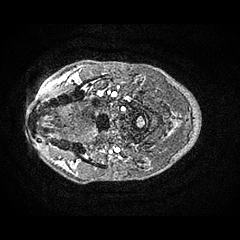

In [20]:
# @title Visualize MRI slice windowing

import io

import numpy as np
import IPython.display
import PIL.Image

import nibabel as nib
import numpy as np

MAX_SLICE = 220

# TODO: Replace with the actual path to your NIfTI file
# E.g., if your NIfTI file is named 'mri_scan.nii.gz' and is in your working directory,
# set nifti_filepath = 'mri_scan.nii.gz'
nifti_filepath = 'T1w_FLR.nii.gz' # Placeholder - Please update this with your file path

try:
    # Load the NIfTI image
    nifti_img = nib.load(nifti_filepath)
    # Get the image data as a NumPy array
    nifti_data = nifti_img.get_fdata()

    # Extract slices from the 3D volume
    # Assuming the NIfTI file contains 3D data where the last dimension is the slice dimension
    # You might need to adjust this depending on your NIfTI file's orientation (e.g., nifti_data[i, :, :] or nifti_data[:, i, :])
    if nifti_data.ndim == 3:
        mri_volume_slices = [nifti_data[:, :, i] for i in range(nifti_data.shape[2])]
        print(f"Successfully loaded {len(mri_volume_slices)} slices from NIfTI file.")
    elif nifti_data.ndim == 4: # Handle 4D data (e.g., fMRI, multiple channels/time points)
        # Assuming the 4th dimension is time or channels, take the first volume/channel
        mri_volume_slices = [nifti_data[:, :, i, 0] for i in range(nifti_data.shape[2])]
        print(f"Successfully loaded {len(mri_volume_slices)} slices from 4D NIfTI file (first volume/channel).")
    else:
        raise ValueError("Unsupported NIfTI data dimension. Expected 3D or 4D.")

except FileNotFoundError:
    print(f"Error: NIfTI file not found at '{nifti_filepath}'. Please upload your file to the Colab environment and update the 'nifti_filepath' variable.")
except Exception as e:
    print(f"An error occurred while loading the NIfTI file: {e}")

# If MAX_SLICE is defined and you want to resample, do it here
# The existing MAX_SLICE (85) from the CT example can be reused.
if 'MAX_SLICE' in locals() and len(mri_volume_slices) > MAX_SLICE:
    # Sample MAX_SLICE slices uniformly across the MRI volume
    mri_volume_slices = [mri_volume_slices[int(round(i / (MAX_SLICE) * (len(mri_volume_slices) - 1)))] for i in range(0, MAX_SLICE)]
    print(f"Resampled to {len(mri_volume_slices)} slices based on MAX_SLICE.")

def window_mri(mri_slice: np.ndarray) -> np.ndarray:
  """Normalize MRI slice to 0-255 and convert to RGB."""
  # Use percentiles to robustly determine the range, avoiding extreme outliers
  min_val = np.percentile(mri_slice, 1)
  max_val = np.percentile(mri_slice, 99)

  # Clip and normalize
  mri_slice = np.clip(mri_slice, min_val, max_val)
  mri_slice = mri_slice.astype(np.float32)
  mri_slice = (mri_slice - min_val) / (max_val - min_val)
  mri_slice = (mri_slice * 255).astype(np.uint8)

  # Stack to create a 3-channel RGB image (grayscale duplicated)
  return np.stack([mri_slice, mri_slice, mri_slice], axis=-1)


# Window MRI Slice Data.
normalized_mri_volume_slices = []
for mri_slice in mri_volume_slices:
  windowed_slice = window_mri(mri_slice)
  # Round slice voxels to nearest integer number.
  windowed_slice = np.round(windowed_slice, 0).astype(np.uint8)
  normalized_mri_volume_slices.append(windowed_slice)

# For compatibility with subsequent cells that expect the old variable name
normalized_ct_volume_slices = normalized_mri_volume_slices

# Visualize windowed MRI Slices.
mri_slice_images = [PIL.Image.fromarray(mri_slice) for mri_slice in normalized_mri_volume_slices]

# Save slice images as animated GIF
with io.BytesIO() as gif_bytes:
  mri_slice_images[0].save(gif_bytes, format="GIF", loop=0, save_all=True, append_images=mri_slice_images[1:], optimize=False, duration=len(normalized_mri_volume_slices)*3)
  mri_slice_animation = gif_bytes.getvalue()
# Display animated GIF in Colab
IPython.display.display(IPython.display.Image(data=mri_slice_animation, format="GIF"))

In [6]:
# @title Install nibabel Python library
%%capture
! pip install nibabel

In [8]:
import nibabel as nib
import numpy as np

# TODO: Replace with the actual path to your NIfTI file
# E.g., if your NIfTI file is named 'mri_scan.nii.gz' and is in your working directory,
# set nifti_filepath = 'mri_scan.nii.gz'
nifti_filepath = 'T1w_FLR.nii.gz' # Placeholder - Please update this with your file path

try:
    # Load the NIfTI image
    nifti_img = nib.load(nifti_filepath)
    # Get the image data as a NumPy array
    nifti_data = nifti_img.get_fdata()

    # Extract slices from the 3D volume
    # Assuming the NIfTI file contains 3D data where the last dimension is the slice dimension
    # You might need to adjust this depending on your NIfTI file's orientation (e.g., nifti_data[i, :, :] or nifti_data[:, i, :])
    if nifti_data.ndim == 3:
        mri_volume_slices = [nifti_data[:, :, i] for i in range(nifti_data.shape[2])]
        print(f"Successfully loaded {len(mri_volume_slices)} slices from NIfTI file.")
    elif nifti_data.ndim == 4: # Handle 4D data (e.g., fMRI, multiple channels/time points)
        # Assuming the 4th dimension is time or channels, take the first volume/channel
        mri_volume_slices = [nifti_data[:, :, i, 0] for i in range(nifti_data.shape[2])]
        print(f"Successfully loaded {len(mri_volume_slices)} slices from 4D NIfTI file (first volume/channel).")
    else:
        raise ValueError("Unsupported NIfTI data dimension. Expected 3D or 4D.")

except FileNotFoundError:
    print(f"Error: NIfTI file not found at '{nifti_filepath}'. Please upload your file to the Colab environment and update the 'nifti_filepath' variable.")
except Exception as e:
    print(f"An error occurred while loading the NIfTI file: {e}")

# If MAX_SLICE is defined and you want to resample, do it here
# The existing MAX_SLICE (85) from the CT example can be reused.
if 'MAX_SLICE' in locals() and len(mri_volume_slices) > MAX_SLICE:
    # Sample MAX_SLICE slices uniformly across the MRI volume
    mri_volume_slices = [mri_volume_slices[int(round(i / (MAX_SLICE) * (len(mri_volume_slices) - 1)))] for i in range(0, MAX_SLICE)]
    print(f"Resampled to {len(mri_volume_slices)} slices based on MAX_SLICE.")

Successfully loaded 220 slices from NIfTI file.
Resampled to 180 slices based on MAX_SLICE.


## Construct MedGemma 1.5 prompt formatted as a chat completion

In [15]:
import base64
import PIL.Image


def _encode(data: np.ndarray) -> str:
  """Encode CT slice imaging inline in prompt."""
  # Image format to encode ct slice images as.
  # options: "jpeg" or "png"
  format = "jpeg"
  with io.BytesIO() as img_bytes:
    with PIL.Image.fromarray(data) as img:
      img.save(img_bytes, format=format)
    img_bytes.seek(0)
    encoded_string = base64.b64encode(img_bytes.getbuffer()).decode("utf-8")
  return f"data:image/{format};base64,{encoded_string}"


instruction = ("You are an instructor teaching medical students. You are "
               "analyzing a T1w brain MRI. Please review the slices provided below "
               "carefully.")

query_text = ("\n\nBased on the visual evidence in the slices provided above, "
              "is this subject healthy? "
              "Comment on any possible abnormalities or indications of neurological conditions. Try also to guess the"
              "age of the subject"
              "\n\nAdditionally, does the subject show any signs of multiple sclerosis?" # New follow-up question
)

content = []
content.append({"type": "text", "text": instruction})
for slice_number, ct_slice in enumerate(normalized_ct_volume_slices, 1):
  content.append({"type": "image", "image": _encode(ct_slice)})
  content.append({"type": "text", "text": f"SLICE {slice_number}"})
content.append({"type": "text", "text": query_text})

messages = [
    {
        "role": "user",
        "content": content
    }
]

In [16]:
# @title Display full MedGemma 1.5 prompt

import json

from IPython.display import display, Markdown


def truncate_prompt(obj, max_len):
  # Clip strings in prompt to avoid displaying excessively large content in Colab notebook.
  if isinstance(obj, dict):
    return {k: truncate_prompt(v, max_len) for k, v in obj.items()}
  elif isinstance(obj, list):
    return [truncate_prompt(elem, max_len) for elem in obj]
  elif isinstance(obj, str) and len(obj) > max_len:
    return obj[:max_len] + "..."  # Add ellipsis for truncated strings
  return obj


txt = json.dumps(truncate_prompt(messages, 100), indent=4, sort_keys=True)
display(Markdown(f"```json\n{txt}"))

```json
[
    {
        "content": [
            {
                "text": "You are an instructor teaching medical students. You are analyzing a T1w brain MRI. Please review th...",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 1",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 2",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 3",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 4",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 5",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 6",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 7",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 8",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 9",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 10",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 11",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 12",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 13",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 14",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 15",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 16",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 17",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 18",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 19",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 20",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 21",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 22",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 23",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 24",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 25",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 26",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 27",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 28",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 29",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 30",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 31",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 32",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 33",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 34",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 35",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 36",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 37",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 38",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 39",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 40",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 41",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 42",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 43",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 44",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 45",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 46",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 47",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 48",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 49",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 50",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 51",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 52",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 53",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 54",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 55",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 56",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 57",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 58",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 59",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 60",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 61",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 62",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 63",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 64",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 65",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 66",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 67",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 68",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 69",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 70",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 71",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 72",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 73",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 74",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 75",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 76",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 77",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 78",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 79",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 80",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 81",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 82",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 83",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 84",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 85",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 86",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 87",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 88",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 89",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 90",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 91",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 92",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 93",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 94",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 95",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 96",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 97",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 98",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 99",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 100",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 101",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 102",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 103",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 104",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 105",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 106",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 107",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 108",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 109",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 110",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 111",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 112",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 113",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 114",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 115",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 116",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 117",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 118",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 119",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 120",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 121",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 122",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 123",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 124",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 125",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 126",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 127",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 128",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 129",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 130",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 131",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 132",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 133",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 134",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 135",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 136",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 137",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 138",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 139",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 140",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 141",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 142",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 143",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 144",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 145",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 146",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 147",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 148",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 149",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 150",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 151",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 152",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 153",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 154",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 155",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 156",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 157",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 158",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 159",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 160",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 161",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 162",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 163",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 164",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 165",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 166",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 167",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 168",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 169",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 170",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 171",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 172",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 173",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 174",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 175",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 176",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 177",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 178",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 179",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 180",
                "type": "text"
            },
            {
                "text": "\n\nBased on the visual evidence in the slices provided above, is this subject healthy? Comment on any...",
                "type": "text"
            }
        ],
        "role": "user"
    }
]

## Authenticate with Hugging Face

Generate a Hugging Face `read` access token by going to [settings](https://huggingface.co/settings/tokens).

If you are using Google Colab, add your access token to the Colab Secrets manager to securely store it. If not, proceed to run the cell below to authenticate with Hugging Face.

1. Open your Google Colab notebook and click on the 🔑 Secrets tab in the left panel. <img src="https://storage.googleapis.com/generativeai-downloads/images/secrets.jpg" alt="The Secrets tab is found on the left panel." width=50%>
2. Create a new secret with the name `HF_TOKEN`.
3. Copy/paste your token key into the Value input box of `HF_TOKEN`.
4. Toggle the button on the left to allow notebook access to the secret.

In [11]:
import os
import sys

google_colab = "google.colab" in sys.modules and not os.environ.get("VERTEX_PRODUCT")

if google_colab:
    # Use secret if running in Google Colab
    from google.colab import userdata
    os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
else:
    # Store Hugging Face data under `/content` if running in Colab Enterprise
    if os.environ.get("VERTEX_PRODUCT") == "COLAB_ENTERPRISE":
        os.environ["HF_HOME"] = "/content/hf"
    # Authenticate with Hugging Face
    from huggingface_hub import get_token
    if get_token() is None:
        from huggingface_hub import notebook_login
        notebook_login()

## Load MedGemma 1.5 from Hugging Face Hub

In [12]:
import torch
import transformers

model_id = "google/medgemma-1.5-4b-it"

model_kwargs = dict(
    dtype=torch.bfloat16,
    device_map="auto",
    offload_buffers=True,
)

processor = transformers.AutoProcessor.from_pretrained(model_id, use_fast=True,  **model_kwargs)
model = transformers.AutoModelForImageTextToText.from_pretrained(model_id, **model_kwargs)

processor_config.json:   0%|          | 0.00/70.0 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.53k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.69M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/2.55k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.64G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/168 [00:00<?, ?B/s]

## Run the model locally and return prediction

In [21]:
# Tokenize text + image prompt
inputs = processor.apply_chat_template(
                 messages,
                 add_generation_prompt=True,
                 continue_final_message=False,
                 return_tensors="pt",  # pytorch
                 tokenize=True,
                 return_dict=True,
             )

# Run generative model
with torch.inference_mode():
  inputs = inputs.to(model.device, dtype=torch.bfloat16)
  # Seting do_sample to promote deterministic model response.
  # Setting max_new_tokens to constrain response length.
  generated_sequence = model.generate(**inputs, do_sample=False, max_new_tokens=500)

# Process response
medgemma_response = processor.post_process_image_text_to_text(generated_sequence, skip_special_tokens=True)
decoded_inputs = processor.post_process_image_text_to_text(inputs["input_ids"], skip_special_tokens=True)
medgemma_response = medgemma_response[0]
# There can be added characters before the input text, so we need to find the
# beginning of the input text in the generated text
index_input_text = medgemma_response.find(decoded_inputs[0])
if 0 <= index_input_text and index_input_text <= 2:
  # If the input text is found, we remove it
  medgemma_response = medgemma_response[index_input_text + len(decoded_inputs[0]):]

# Display result
display(Markdown(f"---\n\n**[ MedGemma ]**\n\n{medgemma_response}\n\n---"))

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


---

**[ MedGemma ]**

Based on the provided MRI slices, the subject appears to be **healthy**. There are no obvious signs of neurological conditions or abnormalities visible in these images. The brain parenchyma appears normal in density and morphology.

It is difficult to determine the exact age of the subject based solely on these slices, but the brain structure appears consistent with an adult.

There are no clear signs of multiple sclerosis (MS) in these slices. MS typically presents with characteristic lesions in the white matter, often in a periventricular distribution, corpus callosum, brainstem, and spinal cord. While subtle white matter changes can be seen in healthy individuals, the provided images do not show the typical pattern or morphology of MS lesions.

Please note that this assessment is based solely on the provided images and may not be definitive without a full clinical evaluation and potentially additional imaging.


---

In [11]:
generated_sequence

tensor([[     2,    105,   2364,  ..., 236787,  11262,    106]],
       device='cuda:0')

## Next steps

Explore the other [notebooks](https://github.com/google-health/medgemma/blob/main/notebooks) to learn what else you can do with the model.